In [126]:
import pandas as pd
import os
import matplotlib.pyplot as plt

from visual_behavior import database as db
import visual_behavior.utilities as vbu
import visual_behavior.plotting as vbp
import sys
import seaborn as sns

from dro.modules import plotting as plot_utils

from dro.modules import eye_tracking as et

from multiprocessing import Pool

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings("ignore")

In [83]:
excluded_sessions = [
    750203572, #horribly noisy!
] #ophys IDs of sessions that should be excluded

In [2]:
%matplotlib notebook

## helper functions

In [3]:
def fix_path(path):
    if sys.platform == 'linux':
        return path.replace('\\','/')
    else:
        return path
    
def isint(string):
    try:
        int(string)
        return True
    except ValueError:
        return False

## functions for finding/extracting necessary data

In [4]:
def get_experiment_folder(experiment_id):
    folder = fix_path(r"\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\visual_behavior_pilot_analysis\visual_behavior_pilot_manuscript_resubmission")
    for fn in os.listdir(folder):
        if isint(fn[:9]) and int(fn[:9]) == int(experiment_id):
            break
        fn = None
    if fn is not None:
        return os.path.join(folder,fn)
    

In [14]:
def get_eyetracking_timestamps(experiment_id):
    folder = get_experiment_folder(experiment_id)
    df = pd.read_hdf(os.path.join(folder,'timestamps.h5'))
    return df['behavior_monitoring'].iloc[0] #note: the 'eye_tracking' and 'behavior_monitoring' labels are swapped in this dataset

In [6]:
def get_omitted_flash_times(experiment_id):
    folder = get_experiment_folder(experiment_id)
    df = pd.read_hdf(os.path.join(folder,'stimulus_table.h5'))
    return df[df['omitted'] == True]['start_time'].values

In [8]:
def ophys_experiment_id_to_ophys_session_id(oeid):
    return db.convert_id({'ophys_experiment_id':oeid},'ophys_session_id')


In [9]:
def get_wkf_path(osid,name):
    wkf = db.get_well_known_files(osid).set_index('name')
    if name in wkf.index:
        return os.path.join(wkf.loc[name]['storage_directory'],wkf.loc[name]['filename'])
    else:
        return None

In [148]:
def event_triggered_response(df, parameter, event_times, t_before=10, t_after=10, sampling_rate=60):
    '''
    build event triggered response around a given set of events
    required inputs:
      df: dataframe of input data
      parameter: column of input dataframe to extract around events
      event_times: times of events of interest
    optional inputs:
      t_before: time before each of event of interest
      t_after: time after each event of interest
      sampling_rate: desired sampling rate of output (input data will be interpolated)
    output:
      dataframe with one time column ('t') and one column of data for each event
    '''
    if 't' in df.columns:
        time_key = 't'
    else:
        time_key = 'time'
        
    d = {time_key:np.arange(-t_before,t_after, 1/sampling_rate)}
    for ii,event_time in enumerate(np.array(event_times)):

        df_local = df.query("{0} > (@event_time - @t_before) and {0} < (@event_time + @t_after)".format(time_key))
        t = df_local[time_key] - event_time
        y = df_local[parameter]
        
        d.update({'event_time={}'.format(event_time):np.interp(d[time_key], t, y)})
    return pd.DataFrame(d)

## plotting functions

In [11]:
def convert_to_fraction(df_in):
    df = df_in.copy()
    cols = [col for col in df.columns if col not in ['t','time']]
    for col in cols:
        s = df[col]
        s0 = df[col].mean(axis=0)
        df[col] = (s - s0)/s0
    return df

In [12]:
def designate_flashes(ax,omit=None,pre_color='blue',post_color='blue'):
    '''add vertical spans to designate stimulus flashes'''
    lims = ax.get_xlim()
    for flash_start in np.arange(0,lims[1],0.75):
        if flash_start != omit:
            ax.axvspan(flash_start,flash_start+0.25,color=post_color,alpha=0.25,zorder=-np.inf)
    for flash_start in np.arange(-0.75,lims[0]-0.001,-0.75):
        if flash_start != omit:
            ax.axvspan(flash_start,flash_start+0.25,color=pre_color,alpha=0.25,zorder=-np.inf)

## open manifest

In [13]:
manifest_path = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\visual_behavior_pilot_analysis\visual_behavior_pilot_manuscript_resubmission\visual_behavior_data_manifest.csv'
manifest_path = manifest_path.replace('\\','/')

manifest = pd.read_csv(manifest_path)
manifest['ophys_session_id'] = manifest['experiment_id'].map(lambda oeid:ophys_experiment_id_to_ophys_session_id(oeid))
manifest['eye_tracking_ellipse_path'] = manifest['ophys_session_id'].map(lambda osid:get_wkf_path(osid, 'EyeTracking Ellipses'))

## open summary of sync issues

In [33]:
sync_issue_summary = pd.read_csv('//allen/programs/braintv/workgroups/nc-ophys/visual_behavior/visual_behavior_ophys_pilot_sync_line_summary.csv')
sync_issue_summary.head()

,behavior_monitoring_sync_count,behavior_movie_frames,experiment_id,eye_movie_frames,eye_tracking_sync_count,ophys_session_id,eye_matches_behavior,eye_matches_eye,eye_beh_diff
0,110394,110316,644942849,110362,110371,644919226,False,False,32
1,119306,119271,645035903,119293,119303,644953594,False,False,13
2,115876,116136,645086795,115868,116164,645055845,False,False,8
3,109152,109006,645362806,109150,109020,645326094,False,False,2
4,112515,112501,646922970,112511,112521,646846415,False,False,4


In [40]:
def has_good_sync(osid):
    return sync_issue_summary.query('ophys_session_id == @osid')['eye_matches_behavior'].iloc[0]
manifest['has_good_sync'] = manifest['ophys_session_id'].map(lambda osid:has_good_sync(osid))
manifest['has_eyetracking'] = pd.notnull(manifest['eye_tracking_ellipse_path'])

## build a new dataframe with one entry per omitted flash across all sessions

In [41]:
list_of_dicts = []
for eid in manifest['experiment_id'].values:
    eye_tracking_timestamps = get_eyetracking_timestamps(eid)
    omitted_flash_times = get_omitted_flash_times(eid)
    for ii,omitted_flash_time in enumerate(omitted_flash_times):
        list_of_dicts.append({
            'experiment_id':eid,
            'omitted_flash_time':omitted_flash_time,
        })

In [42]:
omitted_flash_table = pd.DataFrame(list_of_dicts).merge(manifest, left_on='experiment_id',right_on='experiment_id', how='left')
omitted_flash_table.sample(5)

,experiment_id,omitted_flash_time,experiment_container_id,targeted_structure,imaging_depth,cre_line,reporter_line,full_genotype,session_type,donor_id,specimen_id,experiment_date,ophys_session_id,eye_tracking_ellipse_path,has_good_sync,has_eyetracking
3060,702723649,2456.12092,700821114,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_D,363887,652073919,5/25/2018 14:51,702647224,/allen/programs/braintv/production/neuralcodin...,True,True
16998,673460976,2199.21523,673080995,VISp,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_B,355469,643316601,03/15/2018 13:34,673445687,/allen/programs/braintv/production/neuralcodin...,False,True
3146,692342909,327.19160,692315205,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_A,369320,656813113,4/30/2018 16:09,692315205,/allen/programs/braintv/production/visualbehav...,True,True
529,663773621,2463.94916,661409179,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_C,355469,643316601,2/14/2018 14:44,663754418,/allen/programs/braintv/production/neuralcodin...,True,True
16082,775011398,478.77869,774282251,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_B,409259,741940575,11/7/2018 12:01,774802383,/allen/programs/braintv/production/visualbehav...,True,True


## make an omitted flash plot for one sample session

In [149]:
session = omitted_flash_table.sample(random_state=0).iloc[0]
osid = session['ophys_session_id']
ed = vbu.EyeTrackingData(int(osid))

In [150]:
print(osid)

713171596


In [151]:
etr = event_triggered_response(ed.ellipse_fits['pupil'], 'normalized_blink_corrected_area', omitted_flash_table.query('ophys_session_id == @osid')['omitted_flash_time'].values)
etr_fractional_change = convert_to_fraction(etr)

In [153]:
etr_fractional_change.head()

,time,event_time=37.7708,event_time=43.77551,event_time=72.29881,event_time=106.82705,event_time=135.35028,event_time=151.86369,event_time=205.15723,event_time=219.4189,event_time=308.74193,event_time=341.76892,event_time=354.74611,event_time=364.50415,event_time=382.51886,event_time=396.02988,event_time=408.03968,event_time=412.54335,event_time=426.05443,event_time=432.80993,event_time=495.86148,event_time=573.92533,event_time=585.1844900000001,event_time=635.47562,event_time=638.47807,event_time=693.25624,event_time=694.7573900000001,event_time=718.0264000000001,event_time=740.54488,event_time=754.8065300000001,event_time=775.07306,event_time=781.07798,event_time=786.3322800000001,event_time=789.3347200000001,event_time=805.0976300000001,event_time=809.6012700000001,event_time=824.6136100000001,event_time=830.61846,event_time=840.37644,event_time=851.63565,event_time=868.14916,event_time=951.46725,event_time=961.9758300000001,event_time=976.98811,event_time=985.99549,event_time=1034.03475,event_time=1054.30129,event_time=1056.55312,event_time=1088.8295500000002,event_time=1093.3332500000001,event_time=1102.3406,event_time=1114.3504,event_time=1166.1428,event_time=1175.15012,event_time=1181.15505,event_time=1234.44859,event_time=1235.94984,event_time=1299.752,event_time=1347.79125,event_time=1352.29493,event_time=1359.80106,event_time=1376.3146000000002,event_time=1383.8207,event_time=1408.5909900000001,event_time=1423.60322,event_time=1425.8550500000001,event_time=1434.11182,event_time=1451.37595,event_time=1461.13393,event_time=1463.3857600000001,event_time=1484.40299,event_time=1486.65479,event_time=1554.20999,event_time=1573.7259900000001,event_time=1598.4962,event_time=1602.24929,event_time=1656.2934500000001,event_time=1681.8143300000002,event_time=1708.08584,event_time=1744.8658500000001,event_time=1764.38181,event_time=1772.63856,event_time=1791.4039400000001,event_time=1835.69012,event_time=1888.98366,event_time=1893.48736,event_time=1905.4972,event_time=1906.9984200000001,event_time=1976.8055100000001,event_time=1985.81288,event_time=1988.06468,event_time=2024.84482,event_time=2039.10644,event_time=2054.8693,event_time=2066.87915,event_time=2075.88652,event_time=2090.14817,event_time=2099.90614,event_time=2115.66903,event_time=2118.67149,event_time=2134.43438,event_time=2188.47856,event_time=2210.99695,event_time=2214.75006,event_time=2226.75985,event_time=2231.26352,event_time=2243.27333,event_time=2256.7844,event_time=2301.07057,event_time=2309.32731,event_time=2330.34449,event_time=2341.60372,event_time=2351.36173,event_time=2352.86303,event_time=2355.86539,event_time=2359.61848,event_time=2389.64298,event_time=2401.65281,event_time=2425.67242,event_time=2430.17612,event_time=2448.94149,event_time=2480.46722,event_time=2484.22035,event_time=2485.72155,event_time=2507.48933,event_time=2560.7829,event_time=2596.81236,event_time=2599.8148,event_time=2609.57279,event_time=2626.08631,event_time=2628.33814,event_time=2669.62189,event_time=2697.39458,event_time=2711.6563,event_time=2728.9203700000003,event_time=2731.92287,event_time=2743.9326300000002,event_time=2752.94003,event_time=2768.70291,event_time=2779.21148,event_time=2782.96454,event_time=2800.97928,event_time=2815.9916200000002,event_time=2855.02349,event_time=2867.03328,event_time=2889.55171,event_time=2918.82561,event_time=2969.11676,event_time=2978.12412,event_time=3008.89926,event_time=3023.9116400000003,event_time=3032.16832,event_time=3047.18055,event_time=3065.19537,event_time=3067.44715,event_time=3069.69898,event_time=3079.457,event_time=3084.71124,event_time=3094.46935,event_time=3102.726,event_time=3111.73333,event_time=3115.48643,event_time=3148.51343,event_time=3178.53807,event_time=3192.04904,event_time=3217.56986,event_time=3219.82173,event_time=3264.1079,event_time=3332.41381,event_time=3334.66562,event_time=3352.68033,event_time=3365.44075,event_time=3380.45309,event_time=3383.4555100000002,event_time=3411.22823,event_time=3412.72943,event_ti

<IPython.core.display.Javascript object>


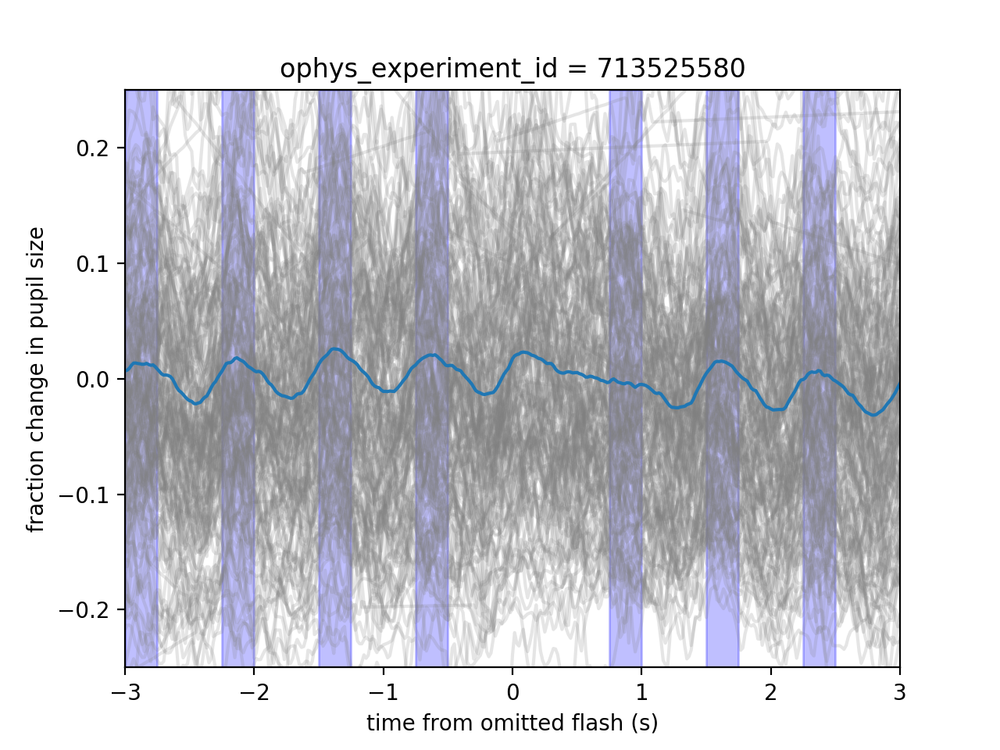

(-0.25, 0.25)

In [152]:
cols = [c for c in etr_fractional_change.columns if c != 'time']
fig,ax=plt.subplots()
for col in cols:
    ax.plot(etr_fractional_change['time'],etr_fractional_change[col],color='gray',alpha=0.2)
ax.plot(etr_fractional_change['time'],etr_fractional_change[cols].mean(axis=1))
designate_flashes(ax,omit=0)
ax.set_xlim(-3,3)
ax.set_title('ophys_experiment_id = {}'.format(session['experiment_id']))
ax.set_xlabel('time from omitted flash (s)')
ax.set_ylabel('fraction change in pupil size')
ax.set_ylim(-0.25,0.25)

<IPython.core.display.Javascript object>


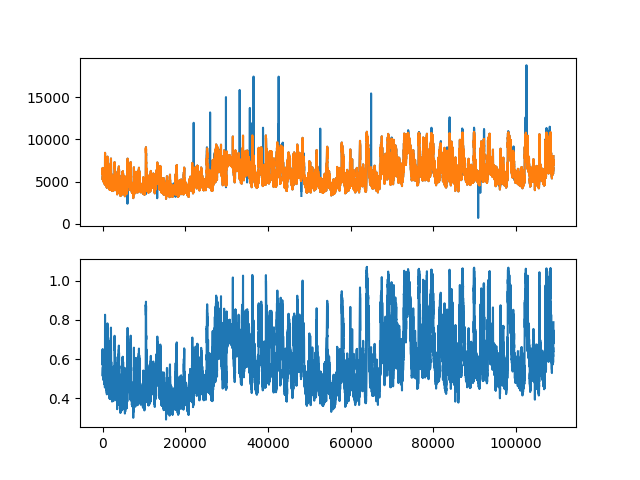

In [47]:
fig,ax=plt.subplots(2,1,sharex=True)
df = ed.ellipse_fits['pupil']
ax[0].plot(df['area'])
ax[0].plot(df['blink_corrected_area'])
ax[1].plot(df['normalized_blink_corrected_area'])

## now repeat for all sessions

In [154]:
def get_average_response(osid):
    # get eye data
    ed = vbu.EyeTrackingData(int(osid))
    
    # get event triggered response
    etr = event_triggered_response(ed.ellipse_fits['pupil'], 'normalized_blink_corrected_area', omitted_flash_table.query('ophys_session_id == @osid')['omitted_flash_time'].values)
    etr_fractional_change = convert_to_fraction(etr)

    cols = [c for c in etr_fractional_change.columns if c != 'time']
    
    df = pd.DataFrame()
    df['time'] = etr_fractional_change['time']
    df[osid] = etr_fractional_change[cols].mean(axis=1)
    
    return osid, df, etr_fractional_change

In [155]:
good_sessions = omitted_flash_table.query('has_good_sync == True and has_eyetracking == True and ophys_session_id not in @excluded_sessions')


osids = good_sessions['ophys_session_id'].unique()
all_trials = {}
with Pool(16) as pool:
    ans = pool.map(get_average_response, osids)
    
omitted_response_averages = pd.DataFrame()
for osid, df, all_trials_df in ans:
    if len(omitted_response_averages) == 0:
        omitted_response_averages['time'] = df['time']
        
    osid = [c for c in df.columns if c != 'time'][0]
    omitted_response_averages[osid] = df[osid]
    
    all_trials[osid] = all_trials_df
    


In [156]:
all_trials[osid].head()

,time,event_time=76.48351,event_time=77.98472,event_time=80.2366,event_time=100.50311,event_time=135.7819,event_time=223.60364,event_time=241.61833,event_time=255.88004,event_time=304.66988,event_time=317.43031,event_time=344.45238,event_time=345.95556,event_time=349.70666,event_time=368.48871,event_time=375.99482,event_time=383.50093,event_time=397.81262,event_time=400.8151,event_time=406.82003,event_time=420.33109,event_time=442.84947,event_time=444.35071,event_time=445.85196,event_time=475.87646,event_time=543.43167,event_time=551.6884200000001,event_time=555.44149,event_time=605.7326,event_time=607.9844300000001,event_time=617.74243,event_time=641.0114500000001,event_time=656.02367,event_time=670.2854500000001,event_time=685.29764,event_time=731.08504,event_time=736.33936,event_time=751.3516000000001,event_time=796.38845,event_time=808.3982800000001,event_time=815.90444,event_time=824.16115,event_time=850.43262,event_time=860.1906100000001,event_time=879.70653,event_time=907.47924,event_time=978.0369300000001,event_time=1011.81452,event_time=1017.0688100000001,event_time=1020.8218800000001,event_time=1026.82682,event_time=1042.58969,event_time=1101.88815,event_time=1104.8906,event_time=1129.66085,event_time=1139.41886,event_time=1173.1964400000002,event_time=1182.9544,event_time=1189.70994,event_time=1196.4654600000001,event_time=1207.72471,event_time=1209.22591,event_time=1214.4803100000001,event_time=1228.74187,event_time=1276.78112,event_time=1284.28725,event_time=1294.0452500000001,event_time=1323.31913,event_time=1330.07467,event_time=1333.07715,event_time=1368.3559500000001,event_time=1371.35843,event_time=1375.86211,event_time=1402.13355,event_time=1435.91118,event_time=1443.4173600000001,event_time=1459.1802,event_time=1482.44928,event_time=1485.45169,event_time=1486.9529300000002,event_time=1504.21705,event_time=1534.24158,event_time=1549.25385,event_time=1600.29555,event_time=1619.81151,event_time=1628.0682900000002,event_time=1631.8213500000002,event_time=1655.84096,event_time=1658.09284,event_time=1669.3519900000001,event_time=1691.11984,event_time=1693.37167,event_time=1701.6284,event_time=1708.38393,event_time=1733.15418,event_time=1763.17875,event_time=1766.9317800000001,event_time=1768.4330300000001,event_time=1775.1885,event_time=1799.9588,event_time=1805.21309,event_time=1813.46984,event_time=1828.4821100000001,event_time=1853.25233,event_time=1865.26218,event_time=1875.0201200000001,event_time=1893.0348800000002,event_time=1917.80512,event_time=1923.8100200000001,event_time=1968.84683,event_time=1970.34803,event_time=1974.8517100000001,event_time=2017.63676,event_time=2078.4364100000003,event_time=2103.2066800000002,event_time=2115.2165,event_time=2118.96954,event_time=2121.97201,event_time=2142.2385600000002,event_time=2150.4953100000002,event_time=2158.75208,event_time=2164.00639,event_time=2200.03581,event_time=2219.55176,event_time=2225.55666,event_time=2227.05791,event_time=2237.56648,event_time=2248.8257,event_time=2262.33679,event_time=2279.60084,event_time=2293.86249,event_time=2363.66957,event_time=2370.42513,event_time=2401.95085,event_time=2413.21011,event_time=2419.96556,event_time=2428.22237,event_time=2470.25668,event_time=2492.0245,event_time=2498.02938,event_time=2513.7923,event_time=2533.30823,event_time=2534.80949,event_time=2542.31559,event_time=2581.34751,event_time=2584.34998,event_time=2590.35486,event_time=2610.62145,event_time=2629.38674,event_time=2632.38923,event_time=2642.89782,event_time=2667.66815,event_time=2671.42115,event_time=2684.18156,event_time=2725.4653,event_time=2753.2380200000002,event_time=2763.7466,event_time=2768.25028,event_time=2824.54633,event_time=2893.60273,event_time=2907.86438,event_time=2911.61748,event_time=2921.37542,event_time=2959.65673,event_time=3005.44414,event_time=3021.20705,event_time=3026.46134,event_time=3036.21933,event_time=3039.9724,event_time=3060.23894,event_time=3083.50796,event_time=3097.01902,event_time=3113.53251,event_time=3133.0484

In [157]:
omitted_response_averages.head()

,time,661514082,663754418,695444116,696112759,700821114,701164546,702013508,702647224,692315205,692805829,693265875,693827332,712038821,712636405,713171596,715027436,715537703,729705760,736204013,715858818,719860866,722894872,723643711,719538773,722884923,731666327,732665103,733351494,736893185,745611633,746727665,754850425,756565197,758180676,751189344,752754560,753612702,754401680,766725279,767197768,768653642,770935047,772503570,773411402,774145732,771235817,772126041,772613829,773419433,768053094,768780431,769382457,760666092,760891059,762166347,768145246,774282251,774802383,775329229,775876749
0,-10.000000,-0.015334,-0.011103,-0.007251,-0.006373,-0.009230,-0.010657,-0.010395,-0.008692,-0.023633,-0.034083,-0.035045,-0.021829,-0.026983,-0.020328,-0.008104,-0.021260,-0.023830,0.010087,-0.015202,-0.015438,-0.015115,-0.017798,-0.010446,0.004084,-0.001146,-0.025865,-0.018495,-0.032354,-0.016740,0.000640,0.011314,-0.017411,-0.020466,-0.018492,-0.011857,-0.018979,-0.013363,-0.013019,-0.008121,-0.006015,-0.004802,-0.011497,-0.017127,-0.024763,-0.015613,-0.010692,-0.024228,-0.020802,-0.012236,-0.004942,-0.001679,-0.015848,-0.000633,-0.012264,-0.012705,-0.016127,-0.013893,-0.004457,-0.020784,-0.029318
1,-9.983333,-0.015353,-0.010831,-0.007070,-0.006355,-0.009094,-0.010474,-0.010553,-0.008217,-0.023472,-0.034485,-0.035781,-0.022362,-0.027152,-0.020359,-0.008380,-0.021637,-0.023419,0.009434,-0.014348,-0.015468,-0.016509,-0.018193,-0.010907,0.004185,-0.002228,-0.026043,-0.018990,-0.032594,-0.016677,0.001818,0.011437,-0.017888,-0.021230,-0.018116,-0.011748,-0.018499,-0.013558,-0.012774,-0.008190,-0.006099,-0.004844,-0.011693,-0.017318,-0.024881,-0.015617,-0.010137,-0.024455,-0.020461,-0.012675,-0.004734,-0.001840,-0.015906,-0.000861,-0.012359,-0.013935,-0.016242,-0.014196,-0.004785,-0.020858,-0.030377
2,-9.966667,-0.015566,-0.010592,-0.006914,-0.006000,-0.008508,-0.010200,-0.009638,-0.007245,-0.022955,-0.034885,-0.037055,-0.023294,-0.027544,-0.019967,-0.009287,-0.021751,-0.022523,0.008426,-0.013286,-0.016365,-0.019318,-0.018892,-0.012279,0.004590,-0.005510,-0.026954,-0.020272,-0.034080,-0.017251,0.003468,0.011194,-0.019856,-0.023224,-0.017207,-0.011798,-0.017475,-0.013514,-0.012720,-0.008242,-0.005886,-0.004336,-0.012440,-0.017476,-0.023499,-0.015847,-0.009418,-0.024819,-0.019590,-0.014199,-0.004571,-0.007726,-0.015581,-0.001249,-0.012347,-0.015844,-0.016707,-0.014583,-0.005918,-0.021414,-0.032468
3,-9.950000,-0.016259,-0.009925,-0.005543,-0.004727,-0.008336,-0.009244,-0.007604,-0.006698,-0.021528,-0.033719,-0.037499,-0.021468,-0.027737,-0.019197,-0.009596,-0.021197,-0.022059,0.008673,-0.012949,-0.017818,-0.020815,-0.019821,-0.012092,0.003102,-0.008042,-0.027910,-0.021536,-0.036664,-0.018904,0.003630,0.009861,-0.022229,-0.025208,-0.015536,-0.011762,-0.016770,-0.013540,-0.012747,-0.008022,-0.005719,-0.003771,-0.012312,-0.017345,-0.021013,-0.015569,-0.010019,-0.024653,-0.018352,-0.015214,-0.004776,-0.015386,-0.016395,-0.002503,-0.011816,-0.017630,-0.016982,-0.014107,-0.007308,-0.022110,-0.033403
4,-9.933333,-0.016980,-0.008562,-0.003622,-0.003502,-0.008261,-0.007697,-0.005221,-0.006697,-0.019769,-0.031631,-0.037299,-0.019727,-0.027300,-0.017596,-0.009482,-0.020541,-0.021923,0.009373,-0.013241,-0.018063,-0.019736,-0.020793,-0.012472,0.000622,-0.007838,-0.026937,-0.022192,-0.038904,-0.019910,0.002267,0.007893,-0.024110,-0.026078,-0.013529,-0.011089,-0.015809,-0.012915,-0.012029,-0.008189,-0.005931,-0.003837,-0.012260,-0.018318,-0.020174,-0.014955,-0.010384,-0.023320,-0.017313,-0.014552,-0.004860,-0.018898,-0.017815,-0.003221,-0.011665,-0.017592,-0.017627,-0.012851,-0.007248,-0.022519,-0.032205


In [161]:
savedir = '//allen/programs/braintv/workgroups/nc-ophys/visual_behavior/ophys_pilot_eyetracking/omission_triggered_averages'
for osid in all_trials.keys():
    all_trials[osid].to_csv(os.path.join(savedir,'osid={}_all_omission_responses').format(osid))

In [162]:
omitted_response_averages.to_csv(os.path.join(savedir,'omission_responses_session_averages.csv'),index=False)

<IPython.core.display.Javascript object>


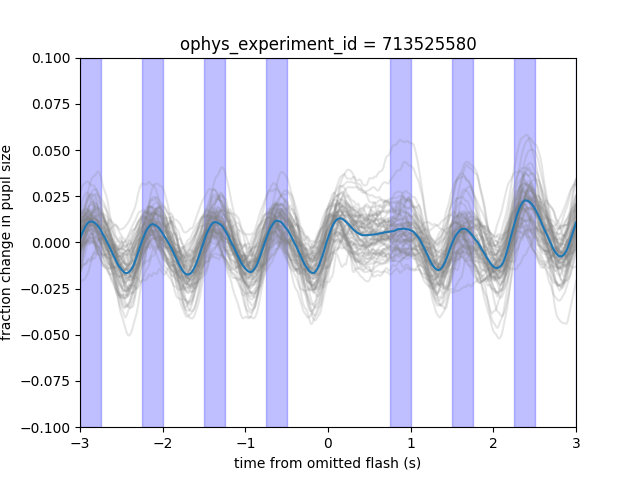

(-0.1, 0.1)

In [86]:
cols = [c for c in omitted_response_averages.columns if c != 'time']
fig,ax=plt.subplots()
for col in cols:
    ax.plot(omitted_response_averages['time'],omitted_response_averages[col],color='gray',alpha=0.2)
ax.plot(omitted_response_averages['time'],omitted_response_averages[cols].mean(axis=1))
designate_flashes(ax,omit=0)
ax.set_xlim(-3,3)
ax.set_title('ophys_experiment_id = {}'.format(session['experiment_id']))
ax.set_xlabel('time from omitted flash (s)')
ax.set_ylabel('fraction change in pupil size')
ax.set_ylim(-0.1,0.1)

In [98]:
len(good_sessions['ophys_session_id'].unique())

60

In [132]:

import plotly.graph_objects as go
fig = plot_utils.plotly_event_triggered_response_plot(
    omitted_response_averages,
    x_value='time',
    y_values=[c for c in omitted_response_averages.columns if c != 'time'],
    var_name='ophys_session_id',
    value_name='fraction change in pupil diameter'
)

fig.update_layout(
    title="omission triggered responses for ophys pilot sessions",
    xaxis_title="time from omitted flash (s)",
)

# fig.update_layout(
#     shapes=[
#         # 1st highlight during Feb 4 - Feb 6
#         go.layout.Shape(
#             type="rect",
# #             # x-reference is assigned to the x-values
# #             xref="x",
# #             # y-reference is assigned to the plot paper [0,1]
# #             yref="paper",
#             x0=0,
#             y0=-0.1,
#             x1=1.5,
#             y1=0.1,
#             fillcolor="LightSalmon",
#             opacity=0.5,
#             layer="below",
#             line_width=0,
#         ),
#     ]
# )

fig.show()

In [91]:
import plotly

In [101]:
plotly.offline.plot(fig, filename='/home/dougo/code/dougollerenshaw.github.io/omission_triggered_average.html')

'/home/dougo/code/dougollerenshaw.github.io/omission_triggered_average.html'

In [110]:
session_types = np.sort(good_sessions.session_type.unique())
session_type = session_types[0]
sessions = good_sessions.query('session_type == @session_type')
sessions['ophys_session_id'].unique()

array([695444116, 700821114, 692315205, 712038821, 715027436, 729705760,
       719860866, 731666327, 751189344, 766725279, 770935047, 771235817,
       768053094, 760666092, 774282251])

In [127]:
def get_colors_for_image_sets():
    colors = [sns.color_palette()[3]] + sns.color_palette('Blues_r', 5)[:3]
    # colors = sns.color_palette()
    # colors = [colors[3],colors[0],colors[2],colors[4]]
    return colors

<IPython.core.display.Javascript object>


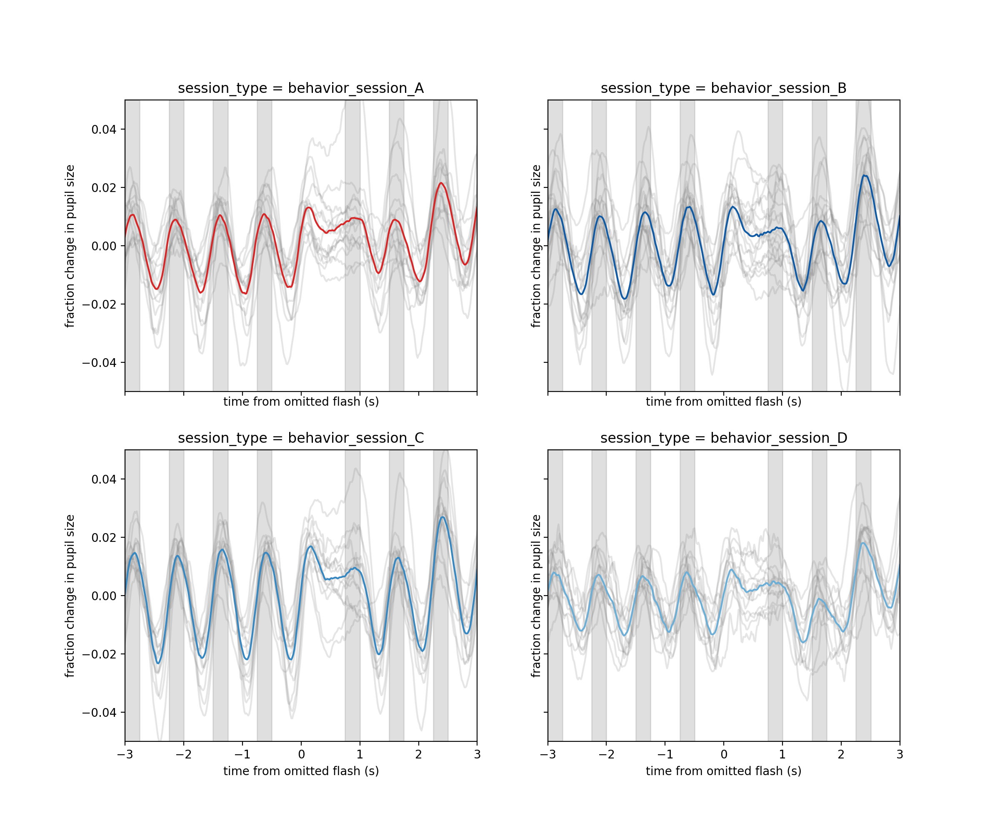

In [141]:
session_types = np.sort(good_sessions.session_type.unique())
colors = get_colors_for_image_sets()

fig,axes=plt.subplots(2,2,figsize=(12,10),sharex=True,sharey=True)

for ii,session_type in enumerate(session_types):
    ax = axes.flatten()[ii]
    sessions = good_sessions.query('session_type == @session_type')
    cols = [c for c in omitted_response_averages.columns if c != 'time' and c in sessions['ophys_session_id'].unique()]
    for col in cols:
        ax.plot(omitted_response_averages['time'],omitted_response_averages[col],color='gray',alpha=0.2)
    ax.plot(omitted_response_averages['time'],omitted_response_averages[cols].mean(axis=1),color=colors[ii])
    designate_flashes(ax,omit=0,pre_color='gray',post_color='gray')
    ax.set_xlim(-3,3)
    ax.set_title('ophys_experiment_id = {}'.format(session['experiment_id']))
    ax.set_xlabel('time from omitted flash (s)')
    ax.set_ylabel('fraction change in pupil size')
    ax.set_ylim(-0.05,0.05)
    ax.set_title('session_type = {}'.format(session_type))


<IPython.core.display.Javascript object>


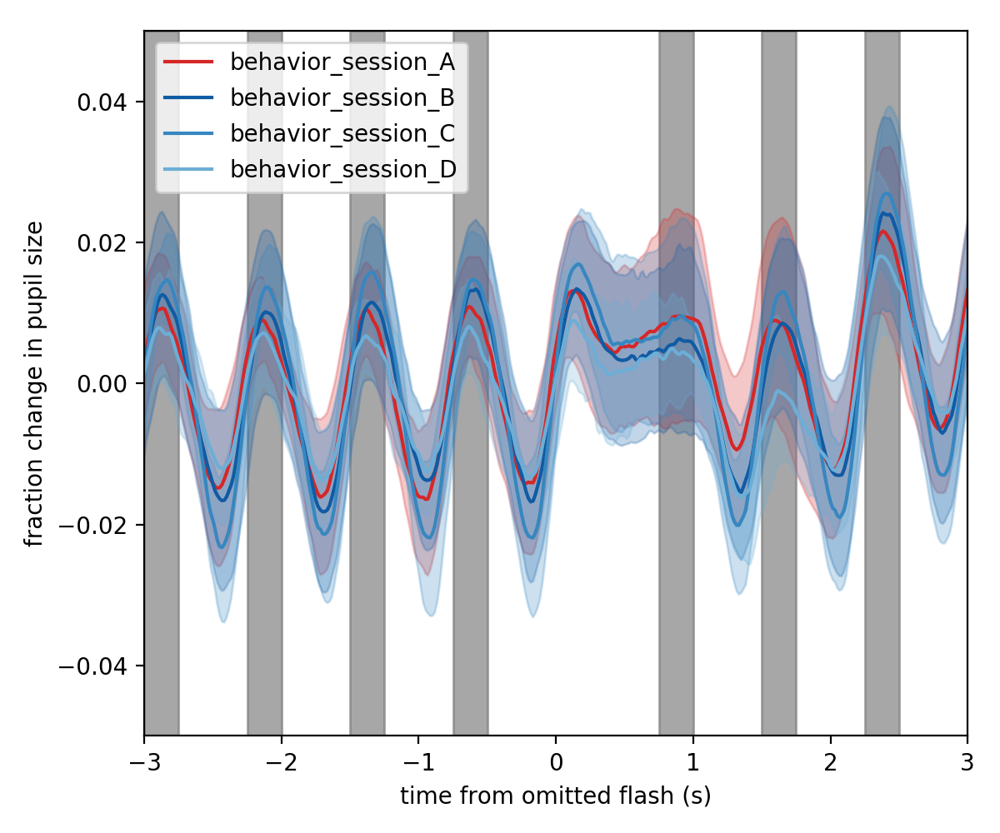

In [144]:
session_types = np.sort(good_sessions.session_type.unique())
colors = get_colors_for_image_sets()

fig,ax=plt.subplots(figsize=(6,5))

for ii,session_type in enumerate(session_types):

    sessions = good_sessions.query('session_type == @session_type')
    cols = [c for c in omitted_response_averages.columns if c != 'time' and c in sessions['ophys_session_id'].unique()]
#     for col in cols:
#         ax.plot(omitted_response_averages['time'],omitted_response_averages[col],color='gray',alpha=0.2)
    ax.plot(omitted_response_averages['time'],omitted_response_averages[cols].mean(axis=1),color=colors[ii])
    ax.fill_between(
        omitted_response_averages['time'],
        omitted_response_averages[cols].mean(axis=1) + omitted_response_averages[cols].std(axis=1),
        omitted_response_averages[cols].mean(axis=1) - omitted_response_averages[cols].std(axis=1),
        color = colors[ii],
        alpha=0.25
    )
    designate_flashes(ax,omit=0,pre_color='gray',post_color='gray')
    ax.set_xlim(-3,3)
    ax.set_xlabel('time from omitted flash (s)')
    ax.set_ylabel('fraction change in pupil size')
    ax.set_ylim(-0.05,0.05)
#     ax.set_title('session_type = {}'.format(session_type))

ax.legend(session_types,loc='upper left')
fig.tight_layout()